<a href="https://colab.research.google.com/github/ferjuaco03/UberDataAnalysis/blob/main/Notebook_Uber.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Importar Librerias**

In [ ]:
#import
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# **Importar Dataset y summary**

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

#importar el dataset desde github
url = "https://raw.githubusercontent.com/ferjuaco03/UberDataAnalysis/refs/heads/main/ncr_ride_bookings.csv"
df = pd.read_csv(url)

#Primera validacion del dataset
print(df.head(10))
print(df.columns)
print(df.shape)
print(df.info())
print(df.describe())
print(df.isnull().sum())

         Date      Time    Booking ID   Booking Status   Customer ID  \
0  2024-03-23  12:29:38  "CNR5884300"  No Driver Found  "CID1982111"   
1  2024-11-29  18:01:39  "CNR1326809"       Incomplete  "CID4604802"   
2  2024-08-23  08:56:10  "CNR8494506"        Completed  "CID9202816"   
3  2024-10-21  17:17:25  "CNR8906825"        Completed  "CID2610914"   
4  2024-09-16  22:08:00  "CNR1950162"        Completed  "CID9933542"   
5  2024-02-06  09:44:56  "CNR4096693"        Completed  "CID4670564"   
6  2024-06-17  15:45:58  "CNR2002539"        Completed  "CID6800553"   
7  2024-03-19  17:37:37  "CNR6568000"        Completed  "CID8610436"   
8  2024-09-14  12:49:09  "CNR4510807"  No Driver Found  "CID7873618"   
9  2024-12-16  19:06:48  "CNR7721892"       Incomplete  "CID5214275"   

    Vehicle Type      Pickup Location      Drop Location  Avg VTAT  Avg CTAT  \
0          eBike          Palam Vihar            Jhilmil       NaN       NaN   
1       Go Sedan        Shastri Nagar  Gurgaon 

In [ ]:
print(df.head(30))

          Date      Time    Booking ID         Booking Status   Customer ID  \
0   2024-03-23  12:29:38  "CNR5884300"        No Driver Found  "CID1982111"   
1   2024-11-29  18:01:39  "CNR1326809"             Incomplete  "CID4604802"   
2   2024-08-23  08:56:10  "CNR8494506"              Completed  "CID9202816"   
3   2024-10-21  17:17:25  "CNR8906825"              Completed  "CID2610914"   
4   2024-09-16  22:08:00  "CNR1950162"              Completed  "CID9933542"   
5   2024-02-06  09:44:56  "CNR4096693"              Completed  "CID4670564"   
6   2024-06-17  15:45:58  "CNR2002539"              Completed  "CID6800553"   
7   2024-03-19  17:37:37  "CNR6568000"              Completed  "CID8610436"   
8   2024-09-14  12:49:09  "CNR4510807"        No Driver Found  "CID7873618"   
9   2024-12-16  19:06:48  "CNR7721892"             Incomplete  "CID5214275"   
10  2024-06-14  16:24:12  "CNR9070334"              Completed  "CID6680340"   
11  2024-09-18  08:09:38  "CNR9551927"        No Dri

## **Esquema De Datos**

| Column Name                        | Description                                                        | Dtype   | Non-Null Count |
|------------------------------------|--------------------------------------------------------------------|---------|---------------:|
| Date                               | Date of the booking                                               | object  | 150000 |
| Time                               | Time of the booking                                               | object  | 150000 |
| Booking ID                         | Unique identifier for each ride booking                            | object  | 150000 |
| Booking Status                     | Status of booking (Completed, Cancelled by Customer, etc.)         | object  | 150000 |
| Customer ID                        | Unique identifier for customers                                    | object  | 150000 |
| Vehicle Type                       | Type of vehicle (Go Mini, Go Sedan, Auto, etc.)                    | object  | 150000 |
| Pickup Location                    | Starting location of the ride                                      | object  | 150000 |
| Drop Location                      | Destination location of the ride                                   | object  | 150000 |
| Avg VTAT                           | Average time for driver to reach pickup (minutes)                  | float64 | 139500 |
| Avg CTAT                           | Average trip duration (minutes)                                    | float64 | 102000 |
| Cancelled Rides by Customer        | Customer-initiated cancellation flag                               | float64 | 10500  |
| Reason for cancelling by Customer  | Reason for customer cancellation                                   | object  | 10500  |
| Cancelled Rides by Driver          | Driver-initiated cancellation flag                                 | float64 | 27000  |
| Driver Cancellation Reason         | Reason for driver cancellation                                     | object  | 27000  |
| Incomplete Rides                   | Incomplete ride flag                                              | float64 | 9000   |
| Incomplete Rides Reason            | Reason for incomplete rides                                        | object  | 9000   |
| Booking Value                      | Total fare amount for the ride                                    | float64 | 102000 |
| Ride Distance                      | Distance covered during the ride (km)                              | float64 | 102000 |
| Driver Ratings                     | Rating given to driver (1–5 scale)                                 | float64 | 93000  |
| Customer Rating                    | Rating given by customer (1–5 scale)                               | float64 | 93000  |
| Payment Method                     | Method used for payment (UPI, Cash, Credit Card, etc.)             | object  | 102000 |



## **Identificar valores Duplicados**

In [ ]:
# Identificar valores duplicados
duplicate_rows = df.duplicated().sum()

print(f"Número de filas duplicadas: {duplicate_rows}")

Número de filas duplicadas: 0


## **Identificar valores Nulos**

In [ ]:
# Crear un dataframe con TotalValues, NullValues, and PercentageNulls
null_summary = pd.DataFrame({
    'TotalValues': df.count(),
    'NullValues': df.isnull().sum(),
    'PercentageNull': (df.isnull().sum() / len(df)) * 100
})

print("Summary of Null Values per Column:")
display(null_summary)


Summary of Null Values per Column:


,TotalValues,NullValues,PercentageNull
Date,150000,0,0.0
Time,150000,0,0.0
Booking ID,150000,0,0.0
Booking Status,150000,0,0.0
Customer ID,150000,0,0.0
Vehicle Type,150000,0,0.0
Pickup Location,150000,0,0.0
Drop Location,150000,0,0.0
Avg VTAT,139500,10500,7.0
Avg CTAT,102000,48000,32.0


## **Validar unique values para  la columna Booking Status**

In [ ]:
# Validar unique values para  'Booking Status'
booking_status_counts = df['Booking Status'].value_counts()

print("Cantidad de valores por tipo en 'Booking Status':")
print(booking_status_counts)

Cantidad de valores por tipo en 'Booking Status':
Booking Status
Completed                93000
Cancelled by Driver      27000
No Driver Found          10500
Cancelled by Customer    10500
Incomplete                9000
Name: count, dtype: int64


## **Validar unique values para  Cancelled Rides by Customer**

In [ ]:
# Validar unique values para  'Cancelled Rides by Customer'
Cancelled_Customer_counts = df['Cancelled Rides by Customer'].value_counts()
Cancelled_Customer_counts_Null = df['Cancelled Rides by Customer'].isnull().sum()

print("Cantidad de valores por tipo en 'Cancelled Rides by Customer':")
print(Cancelled_Customer_counts)
print("Cantidad de valores Null en 'Cancelled Rides by Customer':")
print(Cancelled_Customer_counts_Null)

Cantidad de valores por tipo en 'Cancelled Rides by Customer':
Cancelled Rides by Customer
1.0    10500
Name: count, dtype: int64
Cantidad de valores Null en 'Cancelled Rides by Customer':
139500


Se identifica que los valores Nulos son para los viajes que no fueron cancelados por el customer, pero no tiene datos por lo tanto se van a llenar con cero (0) para no tener valores nulos.

In [ ]:
# llenar valores nulos en  'Cancelled Rides by Customer' con  0
df['Cancelled Rides by Customer'] = df['Cancelled Rides by Customer'].fillna(0)

# Validar cambios
print(df['Cancelled Rides by Customer'].value_counts())
print("Valores Nulos")
print(df['Cancelled Rides by Customer'].isnull().sum())
print(df['Cancelled Rides by Customer'].dtype)

Cancelled Rides by Customer
0.0    139500
1.0     10500
Name: count, dtype: int64
Valores Nulos
0
float64


### llenar valores nulos en  'Reason for cancelling by Customer' con  Not cancelled by Customer

In [ ]:
# llenar valores nulos en  'Reason for cancelling by Customer' con  Not cancelled by Customer

print("----------------------------------------------------------")
print(df['Reason for cancelling by Customer'].value_counts())
print("----------------------------------------------------------")
print("Valores Nulos")
print(df['Reason for cancelling by Customer'].isnull().sum())
print("----------------------------------------------------------")
df['Reason for cancelling by Customer'] = df['Reason for cancelling by Customer'].fillna("Not cancelled by Customer")
# Validar cambios
print("----------------------------------------------------------")
print(df['Reason for cancelling by Customer'].value_counts())
print("----------------------------------------------------------")
print("Valores Nulos")
print(df['Reason for cancelling by Customer'].isnull().sum())
print("----------------------------------------------------------")

----------------------------------------------------------
Reason for cancelling by Customer
Wrong Address                                   2362
Change of plans                                 2353
Driver is not moving towards pickup location    2335
Driver asked to cancel                          2295
AC is not working                               1155
Name: count, dtype: int64
----------------------------------------------------------
Valores Nulos
139500
----------------------------------------------------------
----------------------------------------------------------
Reason for cancelling by Customer
Not cancelled by Customer                       139500
Wrong Address                                     2362
Change of plans                                   2353
Driver is not moving towards pickup location      2335
Driver asked to cancel                            2295
AC is not working                                 1155
Name: count, dtype: int64
----------------------------

## **Validar unique values para  Cancelled Rides by Driver**

In [ ]:

# Validar unique values para  ' Cancelled Rides by Driver'
Cancelled_Drivers_counts = df['Cancelled Rides by Driver'].value_counts()
Cancelled_Drivers_counts_Null = df['Cancelled Rides by Driver'].isnull().sum()

print("Cantidad de valores por tipo en 'Cancelled Rides by Driver':")
print(Cancelled_Drivers_counts)
print("Cantidad de valores Null en 'Cancelled Rides by Driver':")
print(Cancelled_Drivers_counts_Null)

Cantidad de valores por tipo en 'Cancelled Rides by Driver':
Cancelled Rides by Driver
1.0    27000
Name: count, dtype: int64
Cantidad de valores Null en 'Cancelled Rides by Driver':
123000


Se identifica que los valores Nulos son para los viajes que no fueron cancelados por el Driver, pero no tiene datos por lo tanto se van a llenar con cero (0) para no tener valores nulos.

In [ ]:
# llenar valores nulos en  ''Cancelled Rides by Driver'' con  0
df['Cancelled Rides by Driver'] = df['Cancelled Rides by Driver'].fillna(0)

# Validar cambios
print(df['Cancelled Rides by Driver'].value_counts())
print("Valores Nulos")
print(df['Cancelled Rides by Driver'].isnull().sum())
print(df['Cancelled Rides by Driver'].dtype)

Cancelled Rides by Driver
0.0    123000
1.0     27000
Name: count, dtype: int64
Valores Nulos
0
float64


Se validan los nulos en Driver Cancellation Reason y se llenaran con Not cancelled by Driver

In [ ]:
# llenar valores nulos en  'Driver Cancellation Reason' con  Not cancelled by Driver

print("----------------------------------------------------------")
print(df['Driver Cancellation Reason'].value_counts())
print("----------------------------------------------------------")
print("Valores Nulos")
print(df['Driver Cancellation Reason'].isnull().sum())
print("----------------------------------------------------------")
df['Driver Cancellation Reason'] = df['Driver Cancellation Reason'].fillna("Not cancelled by Driver")
# Validar cambios
print("----------------------------------------------------------")
print(df['Driver Cancellation Reason'].value_counts())
print("----------------------------------------------------------")
print("Valores Nulos")
print(df['Driver Cancellation Reason'].isnull().sum())
print("----------------------------------------------------------")

----------------------------------------------------------
Driver Cancellation Reason
Customer related issue                 6837
The customer was coughing/sick         6751
Personal & Car related issues          6726
More than permitted people in there    6686
Name: count, dtype: int64
----------------------------------------------------------
Valores Nulos
123000
----------------------------------------------------------
----------------------------------------------------------
Driver Cancellation Reason
Not cancelled by Driver                123000
Customer related issue                   6837
The customer was coughing/sick           6751
Personal & Car related issues            6726
More than permitted people in there      6686
Name: count, dtype: int64
----------------------------------------------------------
Valores Nulos
0
----------------------------------------------------------


## **Validar unique values para  Incomplete Rides**

In [ ]:
# Validar unique values para  'Incomplete Rides'
Incompleted_counts = df['Incomplete Rides'].value_counts()
Incompleted_counts_Null = df['Incomplete Rides'].isnull().sum()

print("Cantidad de valores por tipo en 'Incomplete Rides':")
print(Incompleted_counts)
print("Cantidad de valores Null en 'Incomplete Rides':")
print(Incompleted_counts_Null)

Cantidad de valores por tipo en 'Incomplete Rides':
Incomplete Rides
1.0    9000
Name: count, dtype: int64
Cantidad de valores Null en 'Incomplete Rides':
141000


Se identifica que los valores Nulos son para los viajes que no fueron incompletos, pero no tiene datos por lo tanto se van a llenar con cero (0) para no tener valores nulos.

In [ ]:
# llenar valores nulos en  ''Incomplete Rides'' con  0
df['Incomplete Rides'] = df['Incomplete Rides'].fillna(0)

# Validar cambios
print(df['Incomplete Rides'].value_counts())
print("Valores Nulos")
print(df['Incomplete Rides'].isnull().sum())
print(df['Incomplete Rides'].dtype)

Incomplete Rides
0.0    141000
1.0      9000
Name: count, dtype: int64
Valores Nulos
0
float64


### llenar valores nulos en  Incomplete Rides Reason con  Not Incompleted

In [ ]:
# llenar valores nulos en  Incomplete Rides Reason con  Not Incompleted

print("----------------------------------------------------------")
print(df['Incomplete Rides Reason'].value_counts())
print("----------------------------------------------------------")
print("Valores Nulos")
print(df['Incomplete Rides Reason'].isnull().sum())
print("----------------------------------------------------------")
df['Incomplete Rides Reason'] = df['Incomplete Rides Reason'].fillna("Not Incompleted")
# Validar cambios
print("----------------------------------------------------------")
print(df['Incomplete Rides Reason'].value_counts())
print("----------------------------------------------------------")
print("Valores Nulos")
print(df['Incomplete Rides Reason'].isnull().sum())
print("----------------------------------------------------------")

----------------------------------------------------------
Incomplete Rides Reason
Customer Demand      3040
Vehicle Breakdown    3012
Other Issue          2948
Name: count, dtype: int64
----------------------------------------------------------
Valores Nulos
141000
----------------------------------------------------------
----------------------------------------------------------
Incomplete Rides Reason
Not Incompleted      141000
Customer Demand        3040
Vehicle Breakdown      3012
Other Issue            2948
Name: count, dtype: int64
----------------------------------------------------------
Valores Nulos
0
----------------------------------------------------------


## Validar valores nulos después de los cambios

In [ ]:
# Crear un dataframe con TotalValues, NullValues, and PercentageNulls
null_summary = pd.DataFrame({
    'TotalValues': df.count(),
    'NullValues': df.isnull().sum(),
    'PercentageNull': (df.isnull().sum() / len(df)) * 100
})

print("Summary of Null Values per Column:")
display(null_summary)


Summary of Null Values per Column:


,TotalValues,NullValues,PercentageNull
Date,150000,0,0.0
Time,150000,0,0.0
Booking ID,150000,0,0.0
Booking Status,150000,0,0.0
Customer ID,150000,0,0.0
Vehicle Type,150000,0,0.0
Pickup Location,150000,0,0.0
Drop Location,150000,0,0.0
Avg VTAT,139500,10500,7.0
Avg CTAT,102000,48000,32.0


Se Filtrara el dtaset por los valores diferentes de Completed en Booking status,  para identificar si los valores nulos para booking value, Avt Ctat y ride distance se debe a que los viajes no se completaron por lo tanto cerian cero

In [ ]:
print("----------------------------------------------------------")
#print(df["Booking Value"].value_counts())
print("----------------------------------------------------------")

# Filtrar filas donde Booking Status sea diferente de 'Completed'
df_no_completed = df[df["Booking Status"] != "Completed"]


print("----------------------'Booking Not completed'------------------------------------")
print("----------------------'Booking Status'------------------------------------")
print(df_no_completed['Booking Status'].value_counts())
print("----------------------------------------------------------")
print("-----------------------'Driver Ratings'-----------------------------------")
print(df_no_completed['Driver Ratings'].value_counts())
print("----------------------------------------------------------")
print("---------------------'Customer Rating'-------------------------------------")
print(df_no_completed['Customer Rating'].value_counts())
print("----------------------------------------------------------")
print("--------------------'Payment Method'--------------------------------------")
print(df_no_completed['Payment Method'].value_counts())
print("----------------------------------------------------------")
print("------------------Booking Value----------------------------------------")
print(df_no_completed["Booking Value"].isna().sum())
print("----------------------------------------------------------")
print("--------------------Ride Distance--------------------------------------")
print(df_no_completed["Ride Distance"].isna().sum())
print("----------------------------------------------------------")

print("--------------------Avg CTAT--------------------------------------")
print(df_no_completed['Avg CTAT'].isna().sum())
print("----------------------------------------------------------")




----------------------------------------------------------
----------------------------------------------------------
----------------------'Booking Not completed'------------------------------------
----------------------'Booking Status'------------------------------------
Booking Status
Cancelled by Driver      27000
No Driver Found          10500
Cancelled by Customer    10500
Incomplete                9000
Name: count, dtype: int64
----------------------------------------------------------
-----------------------'Driver Ratings'-----------------------------------
Series([], Name: count, dtype: int64)
----------------------------------------------------------
---------------------'Customer Rating'-------------------------------------
Series([], Name: count, dtype: int64)
----------------------------------------------------------
--------------------'Payment Method'--------------------------------------
Payment Method
UPI            4075
Cash           2253
Uber Wallet    1070
Credit

se identifica que Avg CTAT, Booking Value, Ride Distance y Payment Method sus valores nulos se deben a que fueron viajes cancelados por customer o driver o no se encontro driver, por lo cual no tiene valores asociados; para resolver los nulos se procedera a dejar un valor de cero para Avg CTAT, Booking Value, y Ride Distance, para Payment Method se deja NA

In [ ]:
#se completan los nulos de Avg CTAT, Booking Value y Ride Distance con 0
#Se completan los nulos de Payment Method con NA debido a que no aplica metodo de pago porque se cancelo el viaje.
df['Avg CTAT'] = df['Avg CTAT'].fillna(0)
df['Booking Value'] = df['Booking Value'].fillna(0)
df['Ride Distance'] = df['Ride Distance'].fillna(0)
df['Payment Method'] = df['Payment Method'].fillna("NA")

# Validar cambios
print("----------------------------------------------------------")
print("Valores Nulos Avg CTA")
print(df['Avg CTAT'].isnull().sum())
print("----------------------------------------------------------")
print("Valores Nulos")
print(df['Booking Value'].isnull().sum())
print("----------------------------------------------------------")
print("Valores Nulos Ride Distance")
print(df['Ride Distance'].isnull().sum())
print("----------------------------------------------------------")
print("Valores Nulos Payment Method")
print(df['Payment Method'].isnull().sum())
print("----------------------------------------------------------")




----------------------------------------------------------
Valores Nulos Avg CTA
0
----------------------------------------------------------
Valores Nulos
0
----------------------------------------------------------
Valores Nulos Ride Distance
0
----------------------------------------------------------
Valores Nulos Payment Method
0
----------------------------------------------------------


# Validar valores nulos después de los cambios

In [ ]:
# Crear un dataframe con TotalValues, NullValues, and PercentageNulls
null_summary = pd.DataFrame({
    'TotalValues': df.count(),
    'NullValues': df.isnull().sum(),
    'PercentageNull': (df.isnull().sum() / len(df)) * 100
})

print("Summary of Null Values per Column:")
display(null_summary)


Summary of Null Values per Column:


,TotalValues,NullValues,PercentageNull
Date,150000,0,0.0
Time,150000,0,0.0
Booking ID,150000,0,0.0
Booking Status,150000,0,0.0
Customer ID,150000,0,0.0
Vehicle Type,150000,0,0.0
Pickup Location,150000,0,0.0
Drop Location,150000,0,0.0
Avg VTAT,139500,10500,7.0
Avg CTAT,150000,0,0.0


### Validación de nulos para ‘Avg VTAT’

In [ ]:
#Se selecionan  los datos donde AVG VTAT es Null
dfAvgVtatNull=df[df['Avg VTAT'].isnull()]

print("----------------------------------------------------------")
print(dfAvgVtatNull["Booking Status"].value_counts())
print("----------------------------------------------------------")




----------------------------------------------------------
Booking Status
No Driver Found    10500
Name: count, dtype: int64
----------------------------------------------------------


Se identifica que los valores nulos en la variable Avg VTAT se deben a casos en los que no se encontró conductor.
Estos valores se mantienen como nulos para evitar distorsionar las estadísticas, dado que se trata de una variable numérica continua.

### Validación de nulos para ‘Driver Ratings’

In [ ]:
#Se selecionan  los datos donde Driver Ratings es Null
dfDriverRatingsNull=df[df['Driver Ratings'].isnull()]

print("----------------------------------------------------------")
print(dfDriverRatingsNull["Booking Status"].value_counts())
print("----------------------------------------------------------")



----------------------------------------------------------
Booking Status
Cancelled by Driver      27000
No Driver Found          10500
Cancelled by Customer    10500
Incomplete                9000
Name: count, dtype: int64
----------------------------------------------------------


Se identifica que los valores nulos en la variable Driver Ratings corresponden a categorías del Booking Status donde el viaje no se completó (Cancelled by Driver, No Driver Found, Cancelled by Customer, Incomplete).
Dado que en estos casos no se realizó el servicio, los valores se mantienen como nulos para evitar distorsionar las estadísticas, ya que no representan una calificación real.

### Validación de nulos para ‘Customer Rating’

In [ ]:

#Se selecionan  los datos donde Customer Rating   es Null
dfDriverRatingsNull=df[df['Driver Ratings'].isnull()]

print("----------------------------------------------------------")
print(dfDriverRatingsNull["Booking Status"].value_counts())
print("----------------------------------------------------------")



----------------------------------------------------------
Booking Status
Cancelled by Driver      27000
No Driver Found          10500
Cancelled by Customer    10500
Incomplete                9000
Name: count, dtype: int64
----------------------------------------------------------


Se observa que los valores nulos en Customer Rating corresponden a viajes que no se completaron (Cancelled by Driver, No Driver Found, Cancelled by Customer e Incomplete).
En estos casos, el valor de la calificación no existe porque el viaje no se llevó a cabo, por lo tanto, no fue posible que el cliente realizara una evaluación.
Por esta razón, los valores se mantienen como nulos, ya que imputarlos podría distorsionar el análisis estadístico.

# ***PENDIENTE VALIDAR COMO COMPLETAR DUPLICADOS PARA Driver Ratings, Customer Rating y Avg VTAT***

# Transformación de variables Date y Time

Transformación de variables temporales para Date y Time

Se realiza la combinación de las columnas Date y Time para crear una nueva variable datetime, que permite representar de forma completa el momento exacto de cada reserva.
A partir de esta nueva variable, se generan columnas adicionales que facilitan un análisis temporal más detallado:

Hour: hora en la que se realizó la reserva.

DayOfWeek: día de la semana (lunes, martes, etc.).

Month: mes correspondiente al registro.

IsWeekend: indicador booleano que identifica si la reserva ocurrió durante el fin de semana.

Year: año de la reserva.

Estas transformaciones permiten realizar análisis más específicos sobre patrones de comportamiento temporal, como la demanda por hora, día o fin de semana, así como tendencias estacionales o anuales.

In [ ]:
# Combinar columnas y convertir a datetime
df["datetime"] = pd.to_datetime(df["Date"] + " " + df["Time"])

# Extraer Caracteristicas de datetime
df['Hour'] = df['datetime'].dt.hour
df['DayOfWeek'] = df['datetime'].dt.day_name()
df['Month'] = df['datetime'].dt.month
df['IsWeekend'] = df['datetime'].dt.weekday >= 5
df['Year'] = df['datetime'].dt.year



print("----------------------------------------------------------")
print()
print(f"Valores Nulos datetime:{df['datetime'].isnull().sum()}")
print(f"Valores Nulos Hour:{df['Hour'].isnull().sum()}")
print(f"Valores Nulos DayOfWeek:{df['DayOfWeek'].isnull().sum()}")
print(f"Valores Nulos Month:{df['Month'].isnull().sum()}")
print(f"Valores Nulos IsWeekend:{df['IsWeekend'].isnull().sum()}")
print(f"Valores Nulos Year:{df['Year'].isnull().sum()}")


print("----------------------------------------------------------")
print("----------------------------------------------------------")
print("Tipo de  dato para datetime")
print(df['datetime'].dtype)
print("----------------------------------------------------------")


----------------------------------------------------------

Valores Nulos datetime:0
Valores Nulos Hour:0
Valores Nulos DayOfWeek:0
Valores Nulos Month:0
Valores Nulos IsWeekend:0
Valores Nulos Year:0
----------------------------------------------------------
----------------------------------------------------------
Tipo de  dato para datetime
datetime64[ns]
----------------------------------------------------------


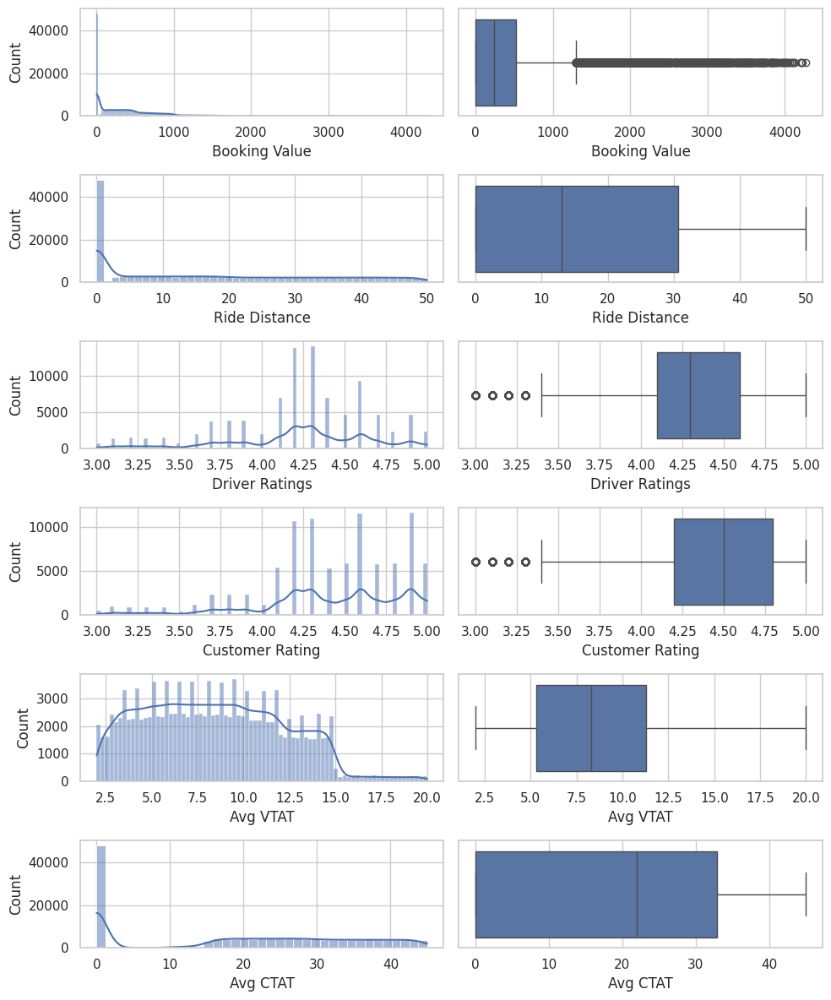

In [ ]:
fig, axes = plt.subplots(6, 2, figsize=(10,12))
sns.histplot(df['Booking Value'], kde=True, ax=axes[0,0])
sns.boxplot(x=df['Booking Value'], ax=axes[0,1])
sns.histplot(df['Ride Distance'], kde=True, ax=axes[1,0])
sns.boxplot(x=df['Ride Distance'], ax=axes[1,1])
sns.histplot(df['Driver Ratings'], kde=True, ax=axes[2,0])
sns.boxplot(x=df['Driver Ratings'], ax=axes[2,1])

sns.histplot(df['Customer Rating'], kde=True, ax=axes[3,0])
sns.boxplot(x=df['Customer Rating'], ax=axes[3,1])

sns.histplot(df['Avg VTAT'], kde=True, ax=axes[4,0])
sns.boxplot(x=df['Avg VTAT'], ax=axes[4,1])

sns.histplot(df['Avg CTAT'], kde=True, ax=axes[5,0])
sns.boxplot(x=df['Avg CTAT'], ax=axes[5,1])


plt.tight_layout()
plt.show()

# **Diagnóstico Inicial**




##Distribución de Booking Status

/tmp/ipython-input-4234781721.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(


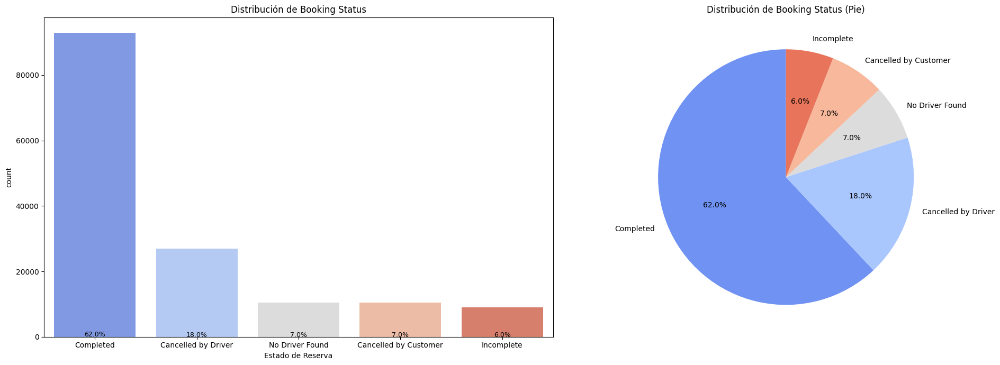

In [ ]:

# Calcular frecuencias
status_counts = df['Booking Status'].value_counts()
status_perc = df['Booking Status'].value_counts(normalize=True) * 100

# Crear figura con 1 fila y 2 columnas
fig, axes = plt.subplots(1, 2, figsize=(20,7))

# --- (1,1) Gráfica de barras con sns ---
ax1 = axes[0]
sns.countplot(
    x='Booking Status',
    data=df,
    order=df['Booking Status'].value_counts().index,
    palette='coolwarm',
    ax=ax1
)

ax1.set_title("Distribución de Booking Status")
ax1.set_xlabel("Estado de Reserva")
#ax1.set_ylabel("")


# Agregar porcentajes encima de cada barra
for i, v in enumerate(status_perc.values):
    ax1.text(i, v + 0.5, f"{v:.1f}%", ha='center', fontsize=9)

# --- (1,2) Gráfica de torta ---
ax2 = axes[1]
colors = sns.color_palette("coolwarm", len(status_counts))  # mismo colormap para consistencia

ax2.pie(
    status_counts.values,
    labels=status_counts.index,
    autopct='%1.1f%%',
    startangle=90,
    colors=colors
)
ax2.set_title("Distribución de Booking Status (Pie)")

plt.tight_layout()
plt.show()

## Distribución de Booking Status por dia

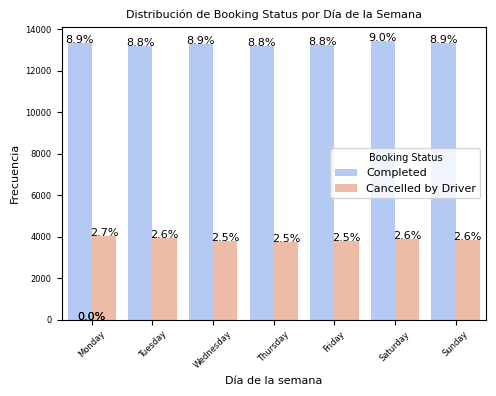

In [ ]:
# Reorder days
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# Crear figura
plt.rcParams.update({'font.size': 8})
plt.figure(figsize=(5,4))


# Countplot con dos categorías (Completed y Cancel) como barras
ax1 = sns.countplot(
    x='DayOfWeek',
    hue='Booking Status',           # <- clave: separa por estado
    data=df,
    order=day_order,
    hue_order=['Completed', 'Cancelled by Driver'],  # <- orden de las barras
    palette='coolwarm'
)

ax1.set_title("Distribución de Booking Status por Día de la Semana", fontsize=8)
ax1.set_xlabel("Día de la semana", fontsize=8)
ax1.set_ylabel("Frecuencia", fontsize=8)
plt.xticks(rotation=45)
ax1.tick_params(axis='x', labelsize=6, rotation=45)
ax1.tick_params(axis='y', labelsize=6)
total = len(df)  # total de registros

for p in ax1.patches:   # cada barra en el gráfico
    height = p.get_height()  # altura de la barra (frecuencia)
    percentage = 100 * height / total
    ax1.text(
        p.get_x() + p.get_width() / 2,  # posición X centrada en la barra
        height + 0.5,                   # un poco encima de la barra
        f"{percentage:.1f}%",           # texto en porcentaje
        ha='center'
    )



plt.legend(title="Booking Status",fontsize=8,title_fontsize=7)
plt.tight_layout()
plt.show()



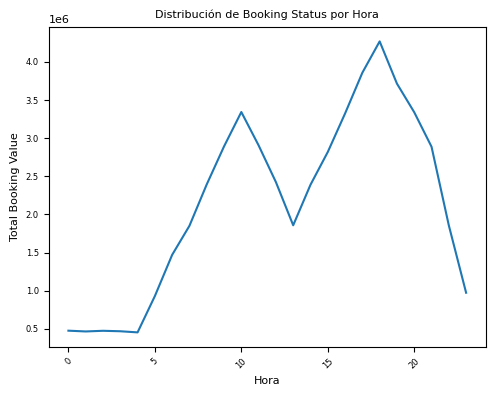

In [ ]:
# Reorder days
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# Crear figura
plt.rcParams.update({'font.size': 8})
plt.figure(figsize=(5,4))

# Agregar el agrupamiento y sumar los valores
df_sum = df.groupby('Hour')['Booking Value'].sum().reset_index()


# Countplot con dos categorías (Completed y Cancel) como barras
ax1 = sns.lineplot(
    x='Hour',
    y="Booking Value",
    data=df_sum
)

ax1.set_title("Distribución de Booking Status por Hora", fontsize=8)
ax1.set_xlabel("Hora", fontsize=8)
ax1.set_ylabel("Total Booking Value", fontsize=8)
plt.xticks(rotation=45)
ax1.tick_params(axis='x', labelsize=6, rotation=45)
ax1.tick_params(axis='y', labelsize=6)
total = len(df_sum)  # total de registros

plt.tight_layout()
plt.show()


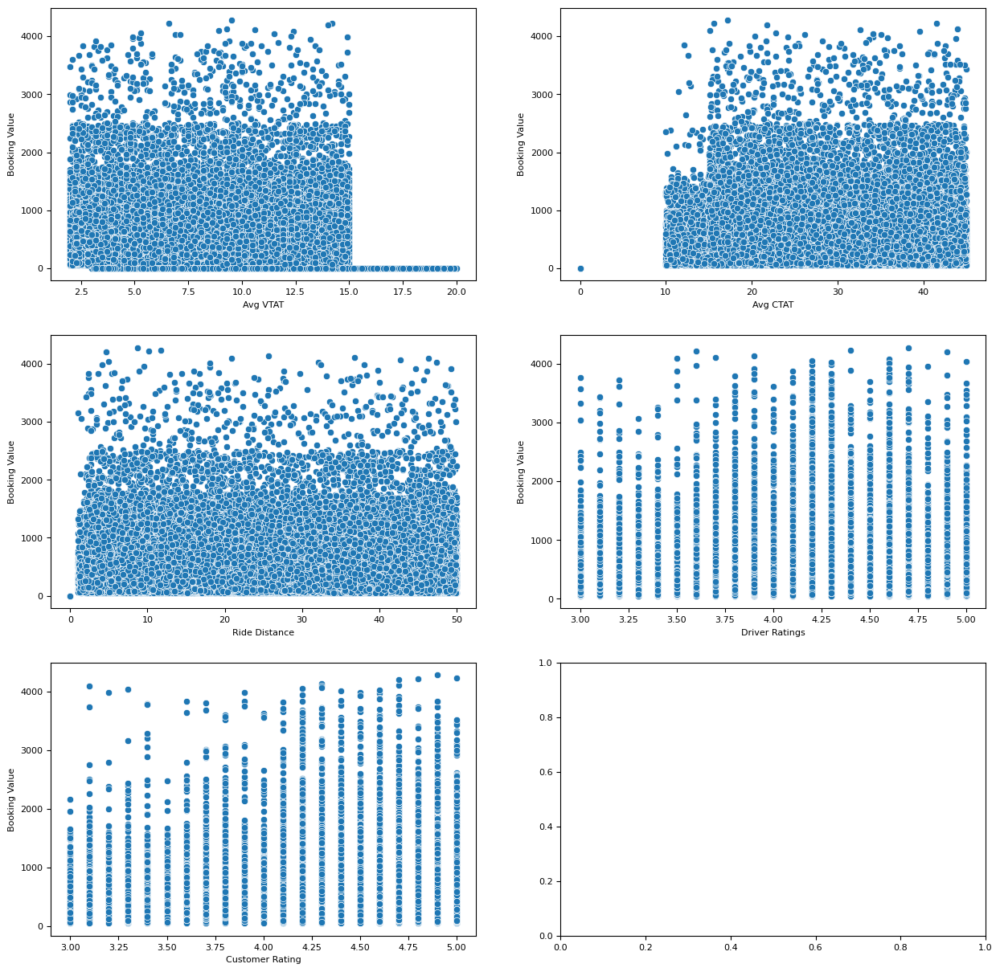

In [ ]:

columns=["Avg VTAT","Avg CTAT","Ride Distance","Driver Ratings","Customer Rating"]# Matrix 2 filas × 2 columnas
fig, axes = plt.subplots(3, 2, figsize=(15, 15))
axes = axes.flatten()

for i, col in enumerate(columns):
    sns.scatterplot(
        data=df, x=col, y='Booking Value',
        #hue='condition', palette='viridis', alpha=0.7,
        ax=axes[i]
    )

hue='Vehicle Type'

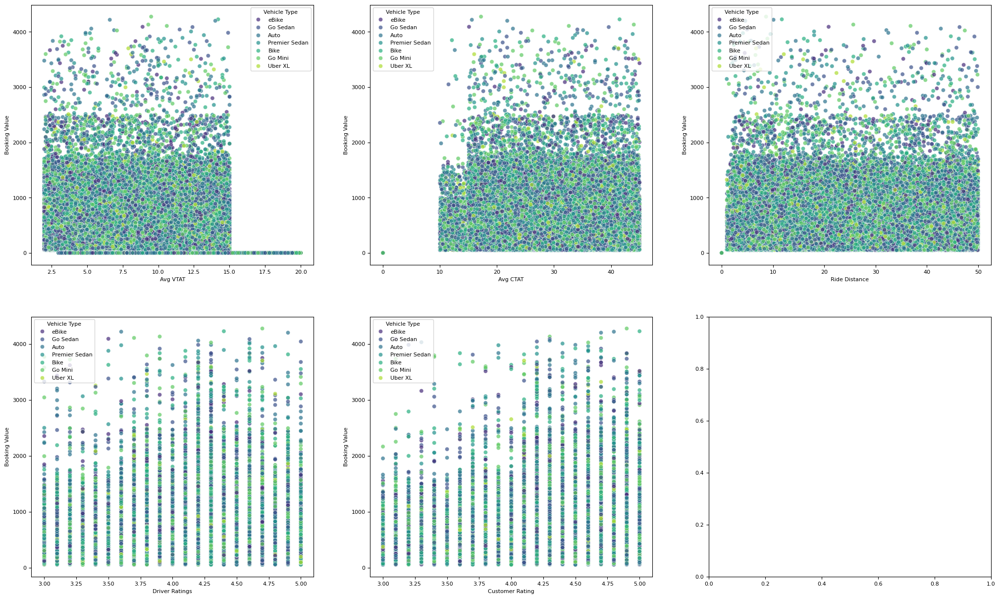

In [ ]:
columns=["Avg VTAT","Avg CTAT","Ride Distance","Driver Ratings","Customer Rating"]# Matrix 2 filas × 2 columnas
fig, axes = plt.subplots(2, 3, figsize=(25, 15))
axes = axes.flatten()

for i, col in enumerate(columns):
    sns.scatterplot(
        data=df, x=col, y='Booking Value',
        hue='Vehicle Type', palette='viridis', alpha=0.7,
        ax=axes[i]
    )

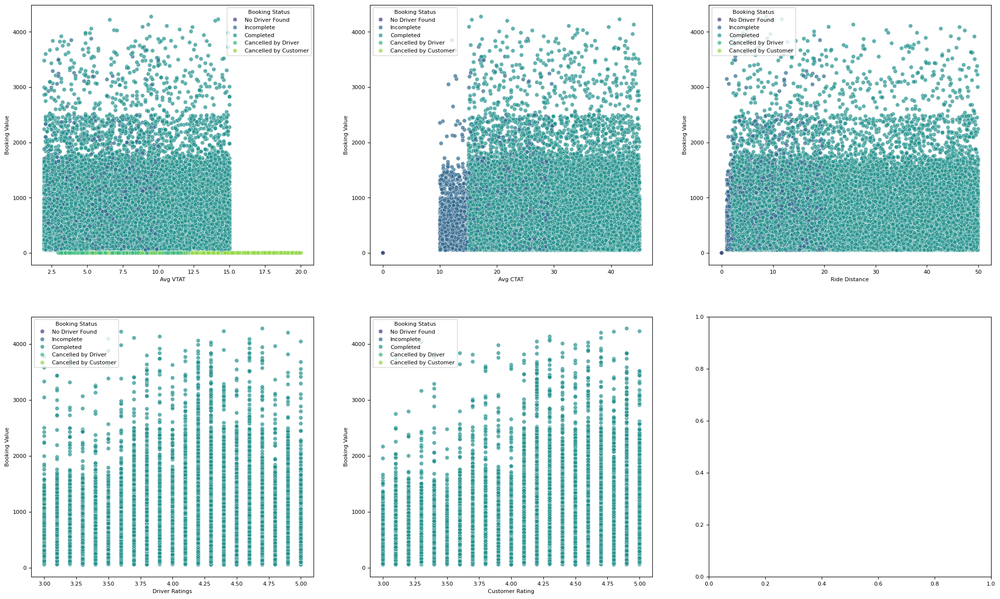

In [ ]:
columns=["Avg VTAT","Avg CTAT","Ride Distance","Driver Ratings","Customer Rating"]# Matrix 2 filas × 2 columnas
fig, axes = plt.subplots(2, 3, figsize=(25, 15))
axes = axes.flatten()

for i, col in enumerate(columns):
    sns.scatterplot(
        data=df, x=col, y='Booking Value',
        hue='Booking Status', palette='viridis', alpha=0.7,
        ax=axes[i]
    )

hue='Cancelled Rides by Customer'

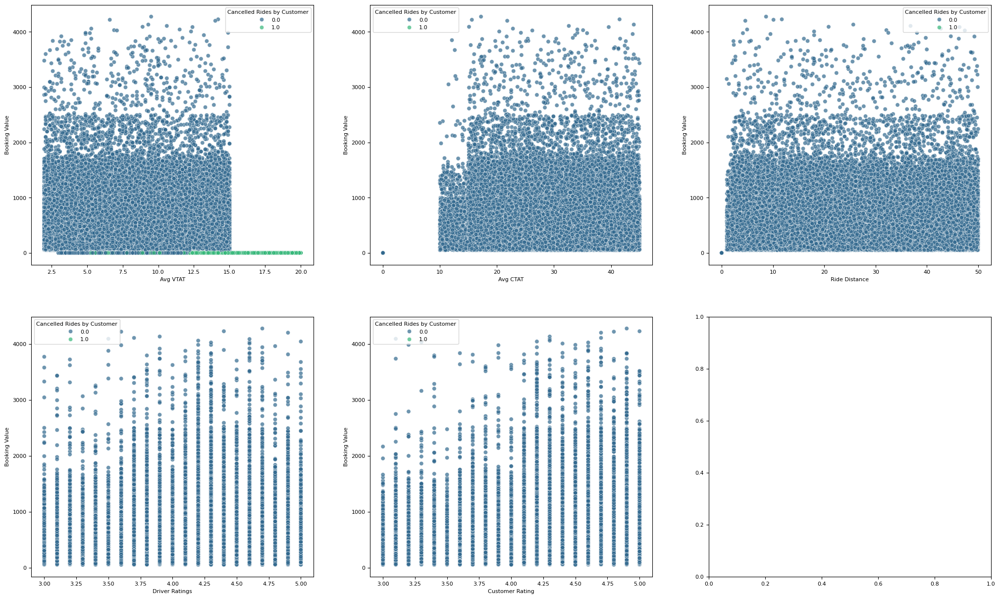

In [ ]:
columns=["Avg VTAT","Avg CTAT","Ride Distance","Driver Ratings","Customer Rating"]# Matrix 2 filas × 2 columnas
fig, axes = plt.subplots(2, 3, figsize=(25, 15))
axes = axes.flatten()

for i, col in enumerate(columns):
    sns.scatterplot(
        data=df, x=col, y='Booking Value',
        hue='Cancelled Rides by Customer', palette='viridis', alpha=0.7,
        ax=axes[i]
    )

hue='Reason for cancelling by Customer'

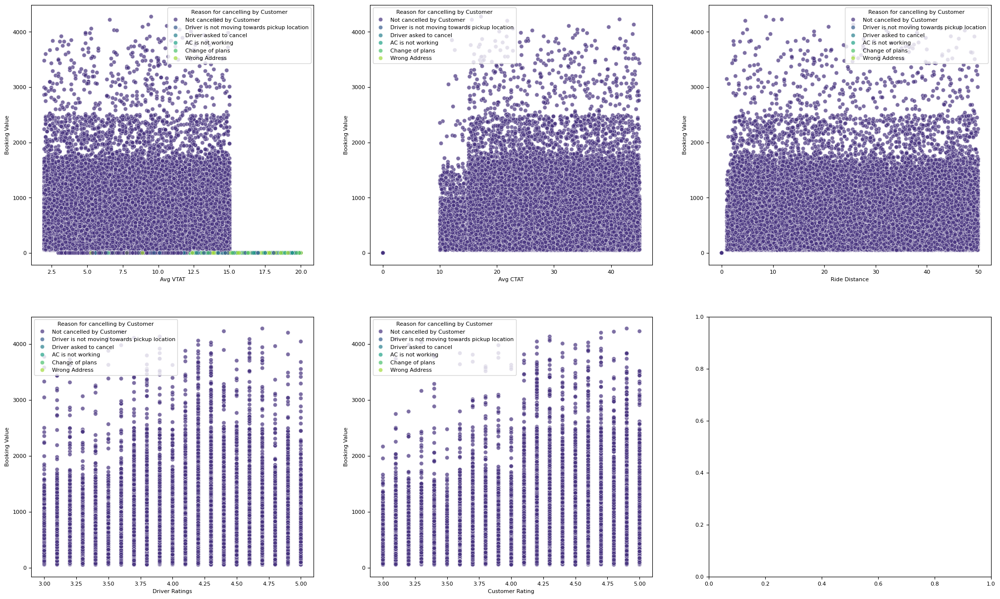

In [ ]:
columns=["Avg VTAT","Avg CTAT","Ride Distance","Driver Ratings","Customer Rating"]# Matrix 2 filas × 2 columnas
fig, axes = plt.subplots(2, 3, figsize=(25, 15))
axes = axes.flatten()

for i, col in enumerate(columns):
    sns.scatterplot(
        data=df, x=col, y='Booking Value',
        hue='Reason for cancelling by Customer', palette='viridis', alpha=0.7,
        ax=axes[i]
    )

hue='Cancelled Rides by Driver'

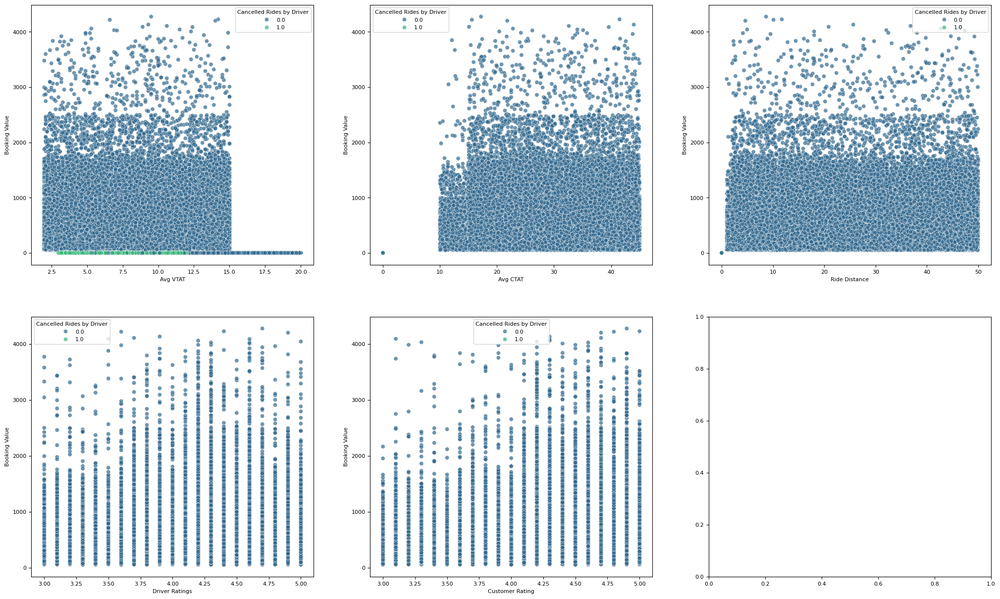

In [ ]:
columns=["Avg VTAT","Avg CTAT","Ride Distance","Driver Ratings","Customer Rating"]# Matrix 2 filas × 2 columnas
fig, axes = plt.subplots(2, 3, figsize=(25, 15))
axes = axes.flatten()

for i, col in enumerate(columns):
    sns.scatterplot(
        data=df, x=col, y='Booking Value',
        hue='Cancelled Rides by Driver', palette='viridis', alpha=0.7,
        ax=axes[i]
    )

hue='Incomplete Rides'

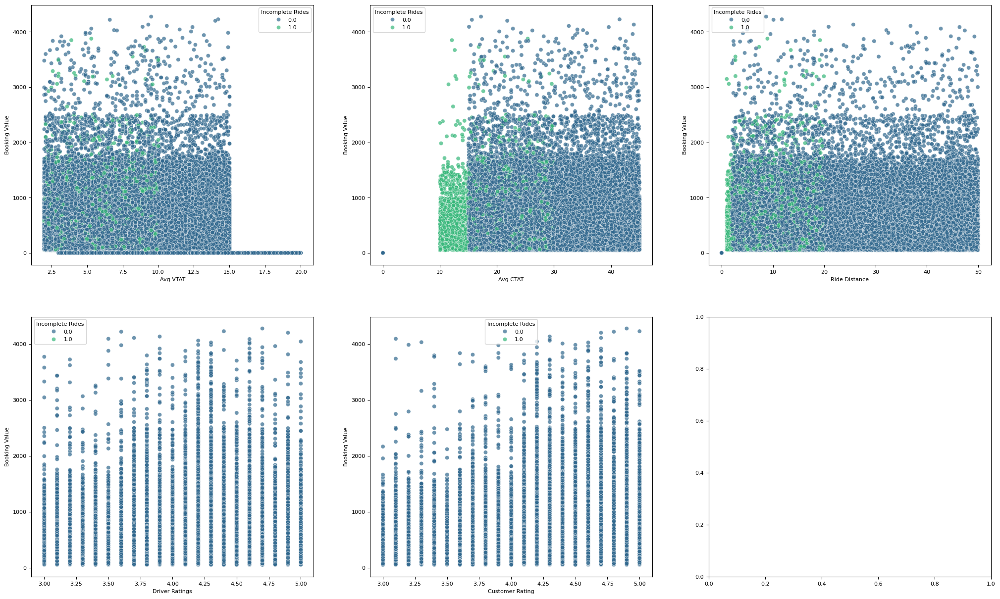

In [ ]:
columns=["Avg VTAT","Avg CTAT","Ride Distance","Driver Ratings","Customer Rating"]# Matrix 2 filas × 2 columnas
fig, axes = plt.subplots(2, 3, figsize=(25, 15))
axes = axes.flatten()

for i, col in enumerate(columns):
    sns.scatterplot(
        data=df, x=col, y='Booking Value',
        hue='Incomplete Rides', palette='viridis', alpha=0.7,
        ax=axes[i]
    )

hue='Payment Method'

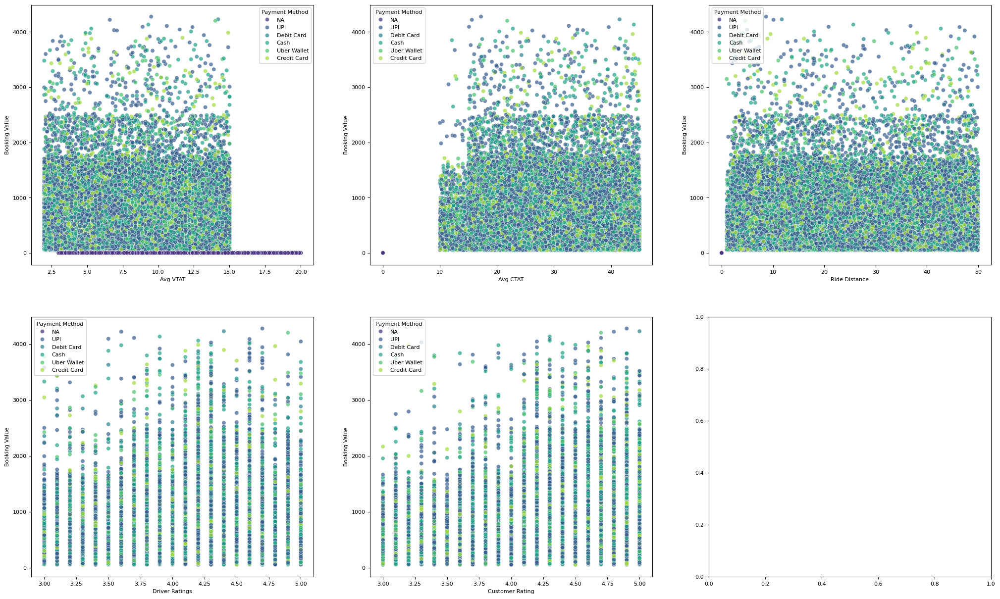

In [ ]:
columns=["Avg VTAT","Avg CTAT","Ride Distance","Driver Ratings","Customer Rating"]# Matrix 2 filas × 2 columnas
fig, axes = plt.subplots(2, 3, figsize=(25, 15))
axes = axes.flatten()

for i, col in enumerate(columns):
    sns.scatterplot(
        data=df, x=col, y='Booking Value',
        hue='Payment Method', palette='viridis', alpha=0.7,
        ax=axes[i]
    )

'Distribución de Vehicle Type (%)'

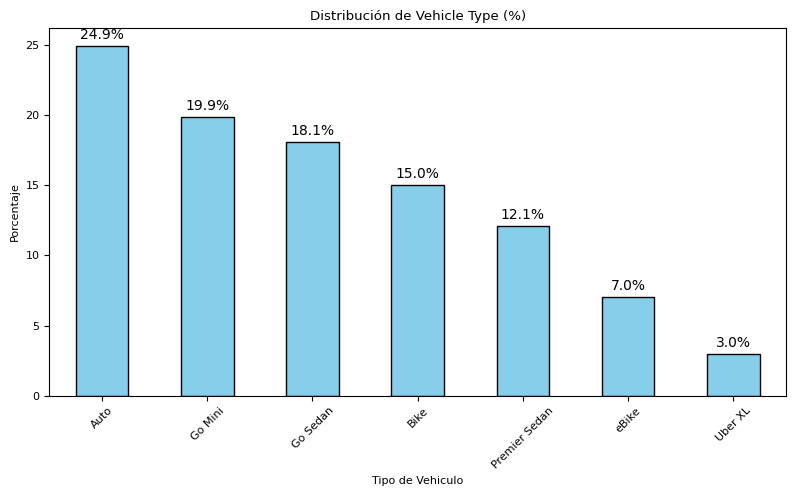

In [ ]:
# Calcular frecuencias en porcentaje
status_counts = df['Vehicle Type'].value_counts(normalize=True) * 100

# Graficar
ax = status_counts.plot(
    kind='bar',
    figsize=(8,5),
    color='skyblue',
    edgecolor='black'
)

# Títulos y etiquetas
plt.title('Distribución de Vehicle Type (%)')
plt.xlabel('Tipo de Vehiculo')
plt.ylabel('Porcentaje')
plt.xticks(rotation=45)

# Agregar porcentaje encima de cada barra
for i, v in enumerate(status_counts):
    ax.text(i, v + 0.5, f'{v:.1f}%', ha='center', fontsize=10)

plt.tight_layout()
plt.show()

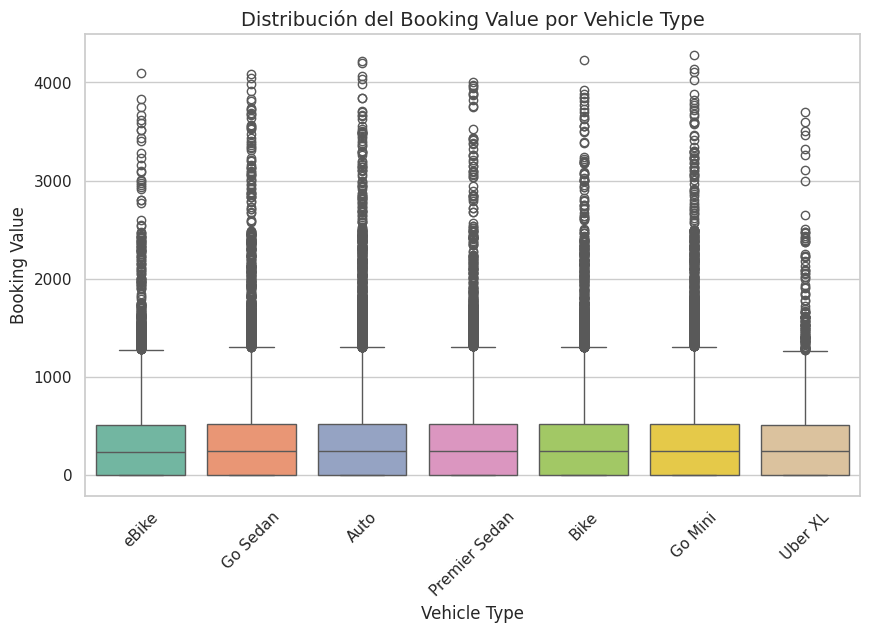

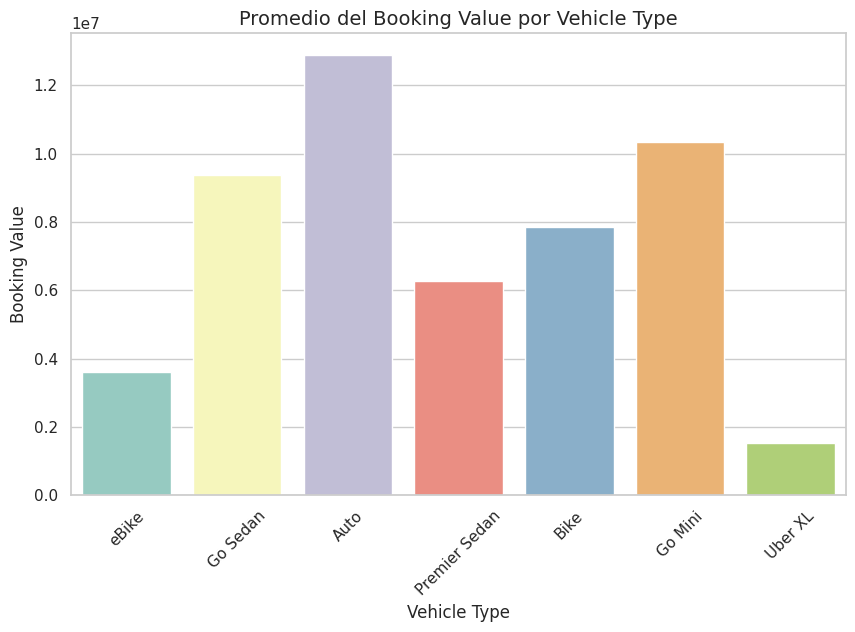

In [ ]:
# Ajustar estilo
sns.set(style="whitegrid")

# === Boxplot: distribución de valores por tipo de vehículo ===
plt.figure(figsize=(10,6))
sns.boxplot(x="Vehicle Type", y="Booking Value", data=df, palette="Set2", hue="Vehicle Type",legend=False)
plt.title("Distribución del Booking Value por Vehicle Type", fontsize=14)
plt.xticks(rotation=45)
plt.show()

# === Barplot: promedio de valores por tipo de vehículo ===
plt.figure(figsize=(10,6))
sns.barplot(x="Vehicle Type", y="Booking Value", data=df, palette="Set3",  hue="Vehicle Type",estimator="sum", errorbar=None,legend=False)
plt.title("Promedio del Booking Value por Vehicle Type", fontsize=14)
plt.xticks(rotation=45)
plt.show()

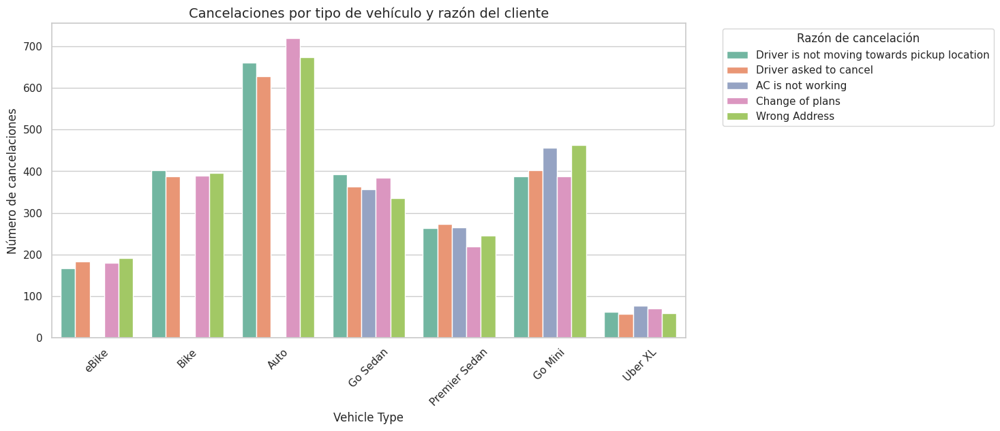

In [ ]:

plt.figure(figsize=(12,6))
sns.countplot(
    data=df[df["Cancelled Rides by Customer"]==1],
    x="Vehicle Type",
    hue="Reason for cancelling by Customer",
    palette="Set2"
)
plt.title("Cancelaciones por tipo de vehículo y razón del cliente", fontsize=14)
plt.xticks(rotation=45)
plt.ylabel("Número de cancelaciones")
plt.legend(title="Razón de cancelación", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

'Distribución de Razón de cancelación Customer (%)'

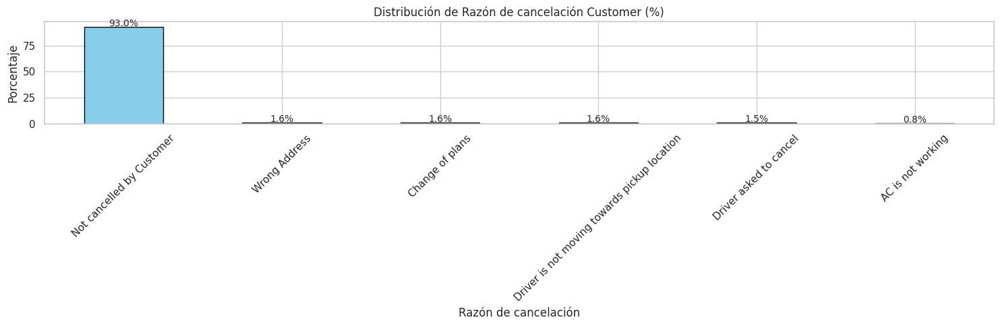

In [ ]:
# Calcular frecuencias en porcentaje
status_counts = df['Reason for cancelling by Customer'].value_counts(normalize=True) * 100

# Graficar
ax = status_counts.plot(
    kind='bar',
    figsize=(15,5),
    color='skyblue',
    edgecolor='black'
)

# Títulos y etiquetas
plt.title('Distribución de Razón de cancelación Customer (%)')
plt.xlabel('Razón de cancelación')
plt.ylabel('Porcentaje')
plt.xticks(rotation=45)

# Agregar porcentaje encima de cada barra
for i, v in enumerate(status_counts):
    ax.text(i, v + 0.5, f'{v:.1f}%', ha='center', fontsize=10)

plt.tight_layout()
plt.show()

Distribución de Payment Method (%)

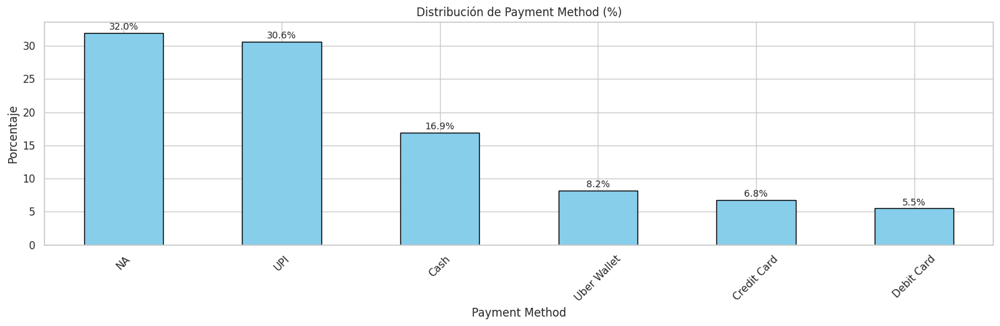

In [ ]:
# Calcular frecuencias en porcentaje
status_counts = df['Payment Method'].value_counts(normalize=True) * 100

# Graficar
ax = status_counts.plot(
    kind='bar',
    figsize=(15,5),
    color='skyblue',
    edgecolor='black'
)

# Títulos y etiquetas
plt.title('Distribución de Payment Method (%)')
plt.xlabel('Payment Method')
plt.ylabel('Porcentaje')
plt.xticks(rotation=45)

# Agregar porcentaje encima de cada barra
for i, v in enumerate(status_counts):
    ax.text(i, v + 0.5, f'{v:.1f}%', ha='center', fontsize=10)

plt.tight_layout()
plt.show()

In [ ]:
print(df["Pickup Location"].value_counts())

Pickup Location
Khandsa             949
Barakhamba Road     946
Saket               931
Badarpur            921
Pragati Maidan      920
                   ... 
Mandi House         800
Noida Sector 18     799
Laxmi Nagar         797
Ashok Vihar         796
Ghitorni Village    790
Name: count, Length: 176, dtype: int64


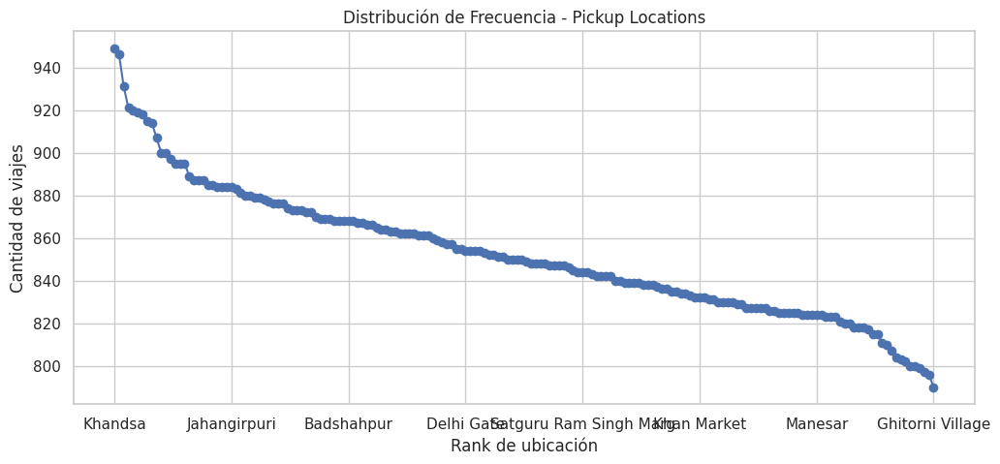

In [ ]:
pickup_counts = df['Pickup Location'].value_counts()

plt.figure(figsize=(12,5))
pickup_counts.plot(kind='line', marker='o')
plt.title("Distribución de Frecuencia - Pickup Locations")
plt.ylabel("Cantidad de viajes")
plt.xlabel("Rank de ubicación")
plt.show()

In [ ]:
print(df["Drop Location"].value_counts())

Drop Location
Ashram              936
Basai Dhankot       917
Lok Kalyan Marg     916
Narsinghpur         913
Cyber Hub           912
                   ... 
MG Road             799
Bhiwadi             792
Shivaji Park        786
Anand Vihar ISBT    784
Huda City Centre    774
Name: count, Length: 176, dtype: int64


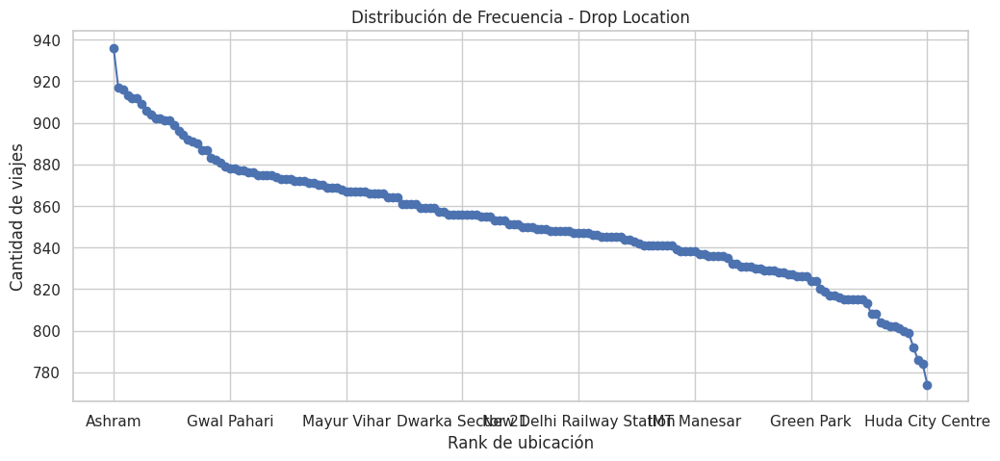

In [ ]:
pickup_counts = df['Drop Location'].value_counts()

plt.figure(figsize=(12,5))
pickup_counts.plot(kind='line', marker='o')
plt.title("Distribución de Frecuencia - Drop Location")
plt.ylabel("Cantidad de viajes")
plt.xlabel("Rank de ubicación")
plt.show()

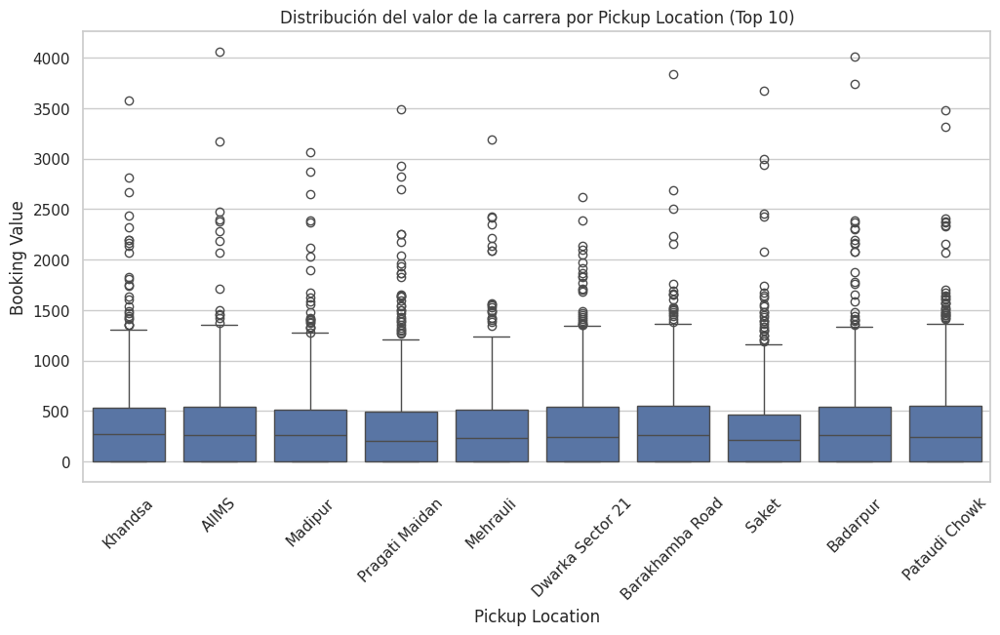

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

top_pickups = df['Pickup Location'].value_counts().head(10).index
subset = df[df['Pickup Location'].isin(top_pickups)]

plt.figure(figsize=(12,6))
sns.boxplot(data=subset, x='Pickup Location', y='Booking Value')
plt.xticks(rotation=45)
plt.title("Distribución del valor de la carrera por Pickup Location (Top 10)")
plt.show()

# JASON

##prueba de cambios!!!!